In [173]:
from HeaderP import *

In [199]:
df = pd.read_pickle('AllztfAge_grp_cor.pkl')
#df['kin_age'] = df['kin_age']-0.5
df['kin_age'] = df['kin_age_cor']

In [200]:
df = df.dropna(subset=['kin_age','Prot'])
df = df.loc[df['kin_age']>0]
#df = df.loc[df['Prot_log']>1].reset_index(drop=True)
len(df)

68216

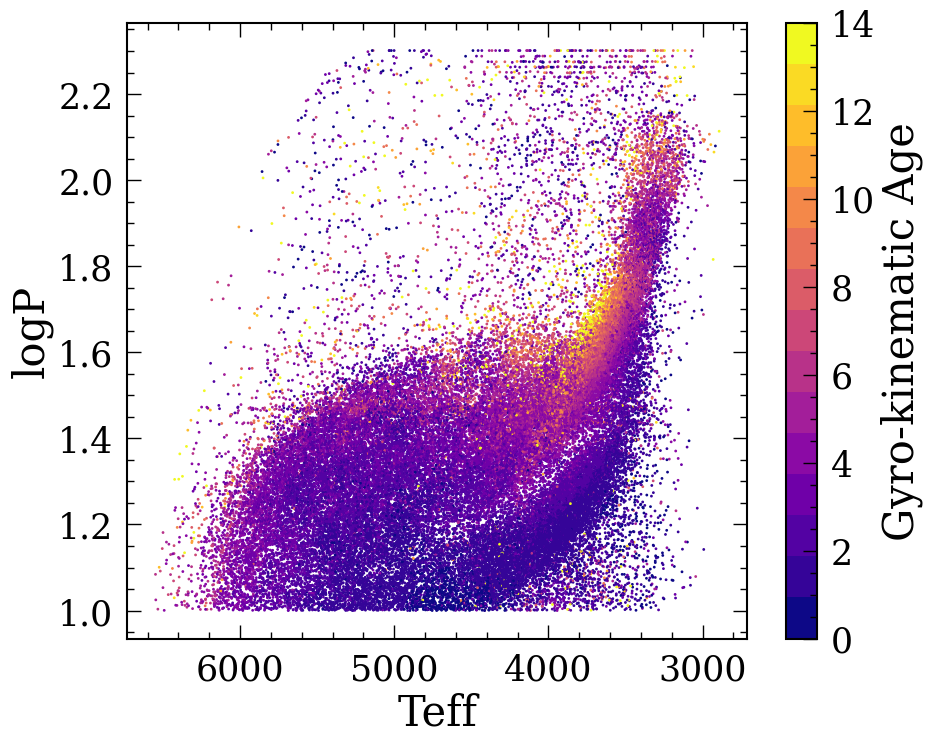

In [169]:
plt.figure(figsize=(10,8))
plt.scatter(df['teff_calc'], df['Prot_log'], c=df['kin_age'], s=1,
           cmap=plt.get_cmap('plasma',15), vmin=0, vmax=14)
plt.xlabel('Teff')
plt.ylabel('logP')
plt.gca().invert_xaxis()
plt.colorbar(label='Gyro-kinematic Age')

In [170]:
print(meanave)

13.973459334597894


/var/folders/w0/h14c78gj4rs91wsbcjh87y2m0000gn/T/ipykernel_10902/2111262488.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(20,8))


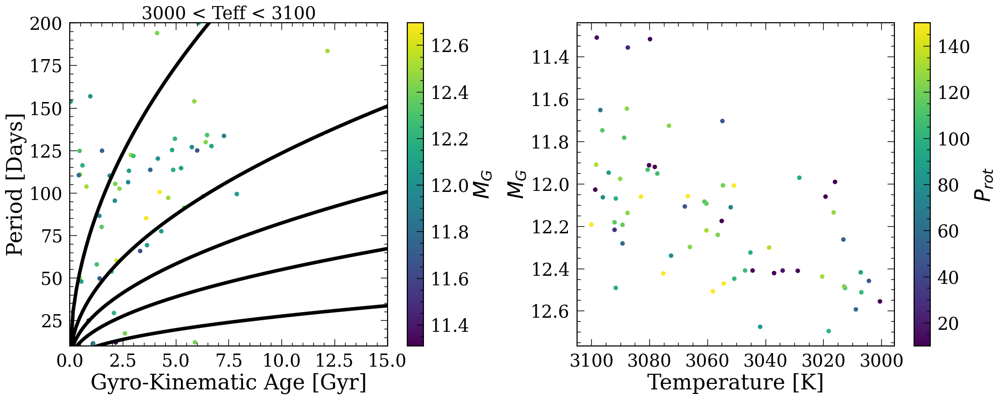

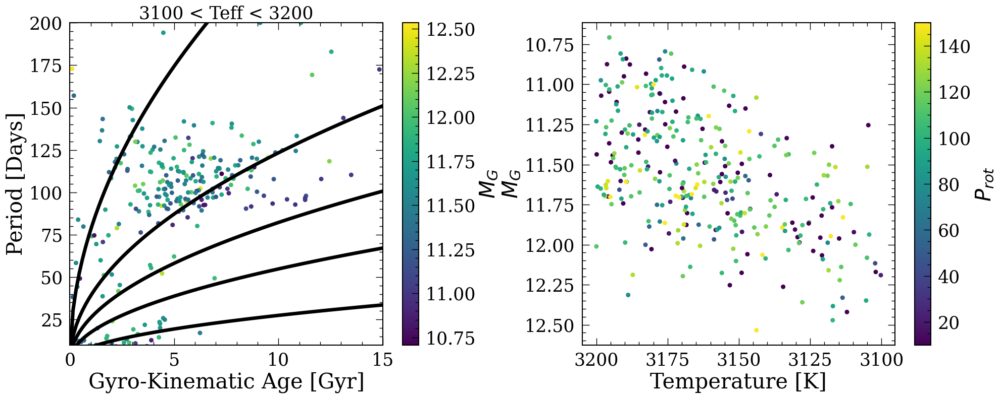

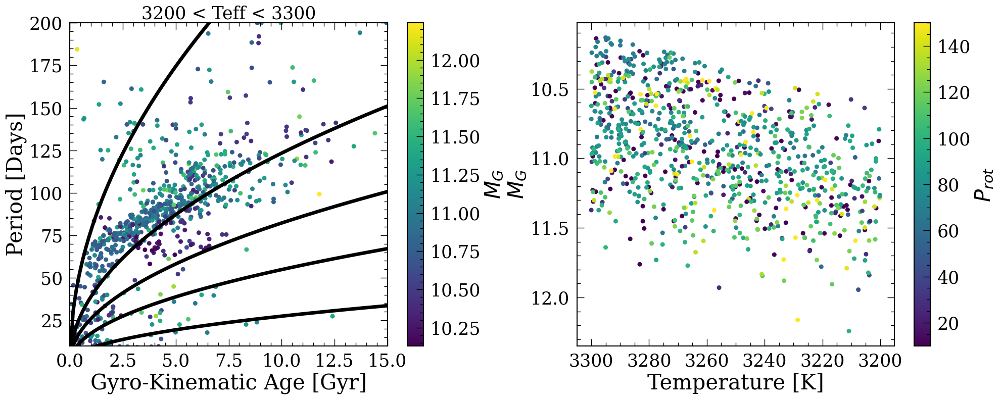

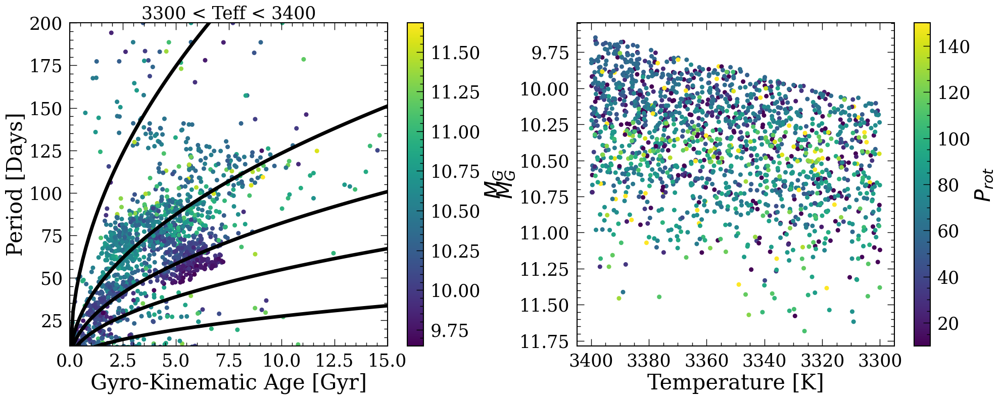

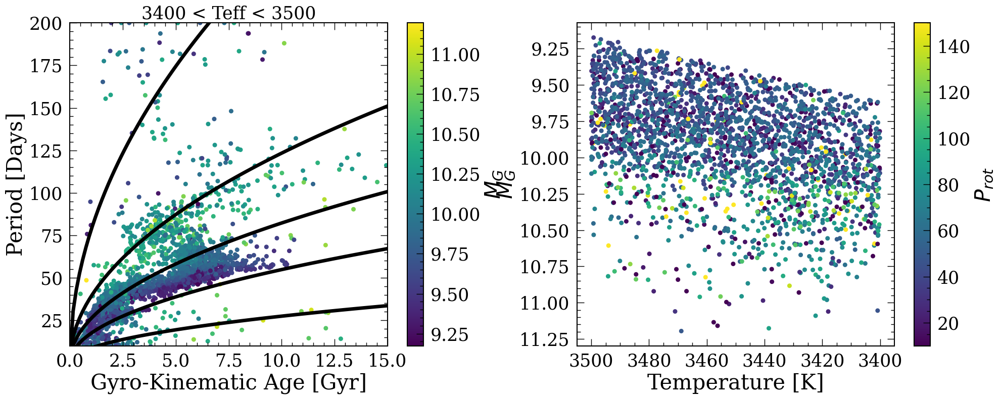

...

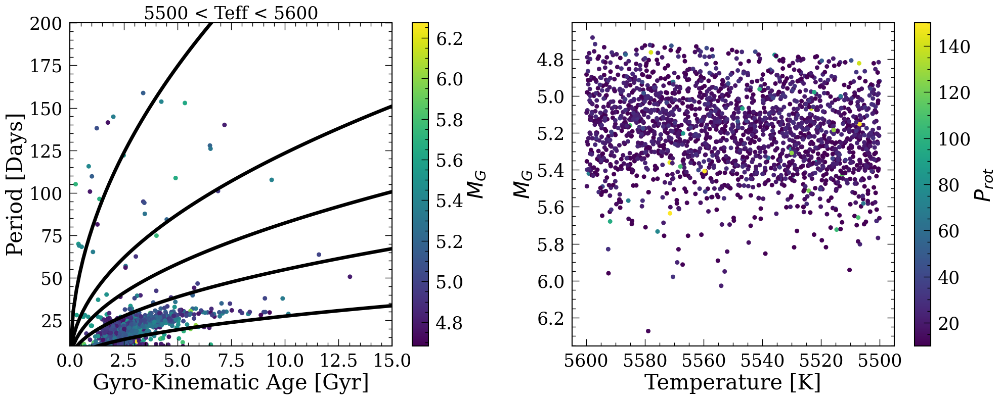

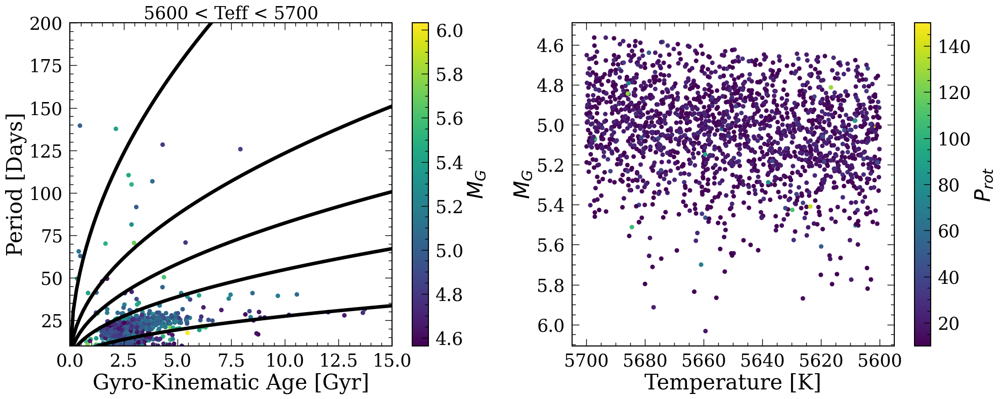

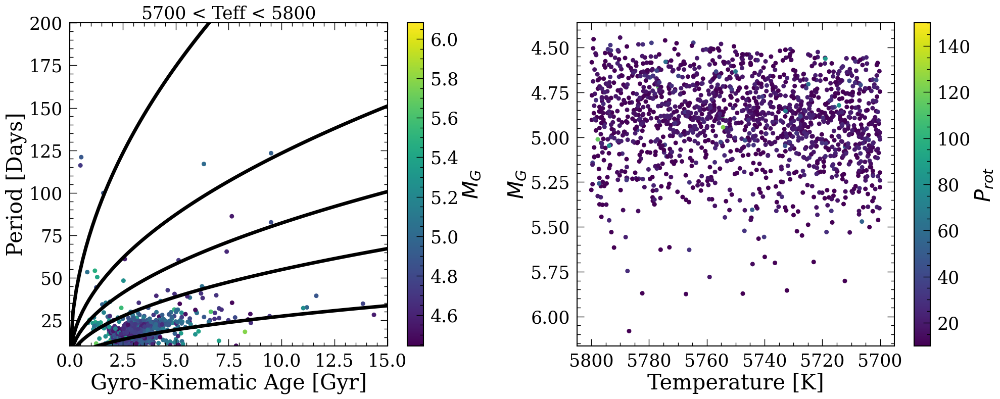

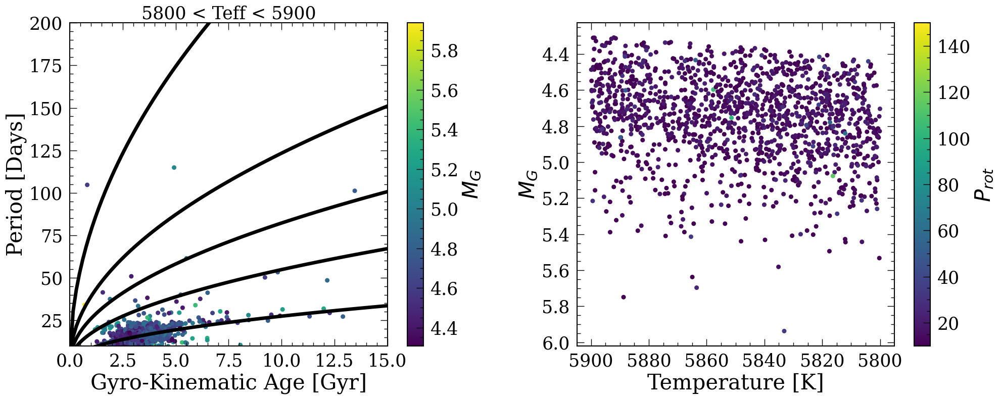

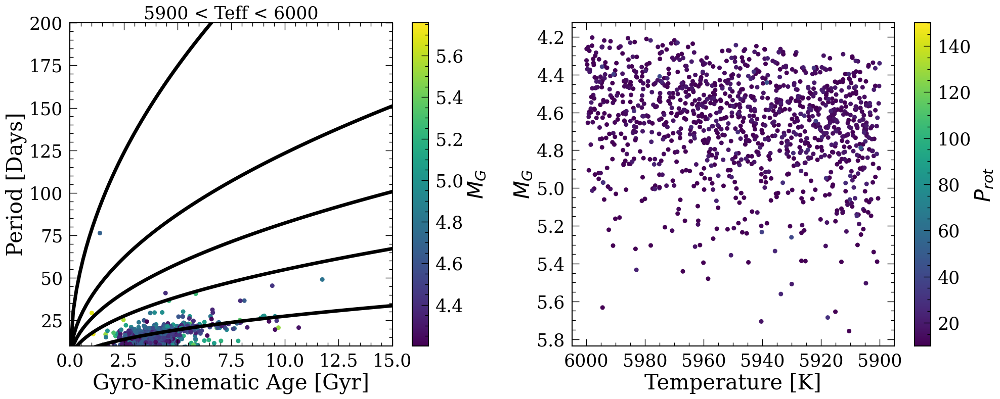

In [216]:
teffrange = np.linspace(3000, 6000, 31)
for i in range(len(teffrange)-1):
    fullyconvective = df.loc[(df['teff_calc']>teffrange[i])&(df['teff_calc']<teffrange[i+1])]
    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    plt.scatter(fullyconvective['kin_age'],fullyconvective['Prot'],
                c=fullyconvective['abs_G_dered'],s=30)
    fullyconvective = fullyconvective.sort_values('kin_age')
    #meanave = np.mean(fullyconvective['Prot'][(fullyconvective['kin_age']<2)&(fullyconvective['kin_age']>1)])
    #print(meanave)
    plt.plot(np.linspace(0,15,100), np.linspace(0,15,100)**0.5*26,
            'k-',linewidth=5)
    plt.plot(np.linspace(0,15,100), np.linspace(0,15,100)**0.5*26*1.5,
            'k-',linewidth=5)
    plt.plot(np.linspace(0,15,100), np.linspace(0,15,100)**0.5*26/1.5,
            'k-',linewidth=5)
    plt.plot(np.linspace(0,15,100), np.linspace(0,15,100)**0.5*26*3,
            'k-',linewidth=5)
    plt.plot(np.linspace(0,15,100), np.linspace(0,15,100)**0.5*26/3,
            'k-',linewidth=5)
    plt.title('%d < Teff < %d'%(teffrange[i], teffrange[i+1]), fontsize=25)
    plt.xlim([0,15])
    plt.ylim([10,200])
    #plt.yscale('log')
    plt.xlabel('Gyro-Kinematic Age [Gyr]')
    plt.ylabel('Period [Days]')
    plt.colorbar(label='$M_G$')

    plt.subplot(1,2,2)
    plt.scatter(fullyconvective['teff_calc'],fullyconvective['abs_G_dered'],
                c=fullyconvective['Prot'],s=30, vmin=10, vmax=150)
    plt.xlabel('Temperature [K]')
    plt.ylabel('$M_G$')
    plt.gca().invert_yaxis()
    plt.gca().invert_xaxis()
    plt.colorbar(label='$P_{rot}$')
    plt.tight_layout()

# With metallicity measurements from LAMOST?

In [208]:
from astropy.io import ascii
feh = ascii.read('../GaiaDR3/Mdwarf_APOGEE_parameter.txt').to_pandas()


In [209]:
feh['ra'] = np.array(feh['RAdeg'], dtype=float)
feh['dec'] = np.array(feh['DEdeg'], dtype=float)

In [210]:
feh['dec'].dropna(), len(feh)
df['dec'].dropna(), len(df)
df = df.dropna(subset=['ra','dec'])

In [211]:
"""kepler = readfits('kepler_dr3_1arcsec.fits')
dfkepler = df.loc[df['KID']!=0]
print(len(dfkepler))
dfkepler = pd.merge(dfkepler, kepler[['kepid','source_id','ra','dec']], left_on='KID',
                   right_on='kepid',how='inner')
print(len(dfkepler))

dfkepler['gaiaid'] = dfkepler['source_id']
df['ra'] = np.array(df['ra_x'], dtype=float)
df['dec'] = np.array(df['dec_x'], dtype=float)
df = pd.concat([df.loc[df['KID']==0], dfkepler])
df.to_pickle('AllztfAge_grp_cor.pkl')"""

"kepler = readfits('kepler_dr3_1arcsec.fits')\ndfkepler = df.loc[df['KID']!=0]\nprint(len(dfkepler))\ndfkepler = pd.merge(dfkepler, kepler[['kepid','source_id','ra','dec']], left_on='KID',\n                   right_on='kepid',how='inner')\nprint(len(dfkepler))\n\ndfkepler['gaiaid'] = dfkepler['source_id']\ndf['ra'] = np.array(df['ra_x'], dtype=float)\ndf['dec'] = np.array(df['dec_x'], dtype=float)\ndf = pd.concat([df.loc[df['KID']==0], dfkepler])\ndf.to_pickle('AllztfAge_grp_cor.pkl')"

In [212]:
feh['ra'].dropna()
feh = crossmatch(feh, df)

/Users/yl4331/Desktop/NewGyroKineage/HeaderP.py:1346: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1df2[i]=df1.iloc[idx][i].values
/Users/yl4331/Desktop/NewGyroKineage/HeaderP.py:1346: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1df2[i]=df1.iloc[idx][i].values
/Users/yl4331/Desktop/NewGyroKineage/HeaderP.py:1346: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

(3100.0, 4200.0)

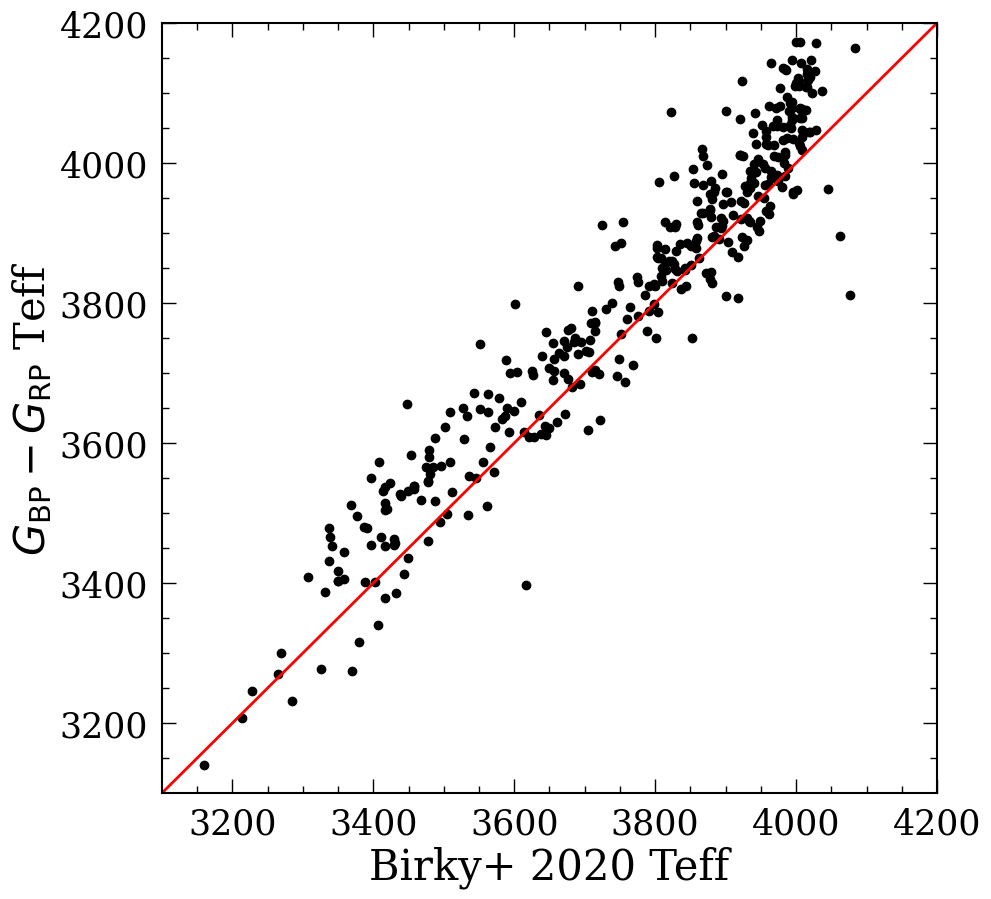

In [213]:
plt.plot(feh['Teff'], feh['teff_calc'],'ko')
plt.xlabel('Birky+ 2020 Teff')
plt.ylabel('$G_{\\rm{BP}}-G_{\\rm{RP}}$ Teff')
plt.plot([3100,4200],[3100,4200],'r-')
plt.xlim([3100, 4200])
plt.ylim([3100, 4200])

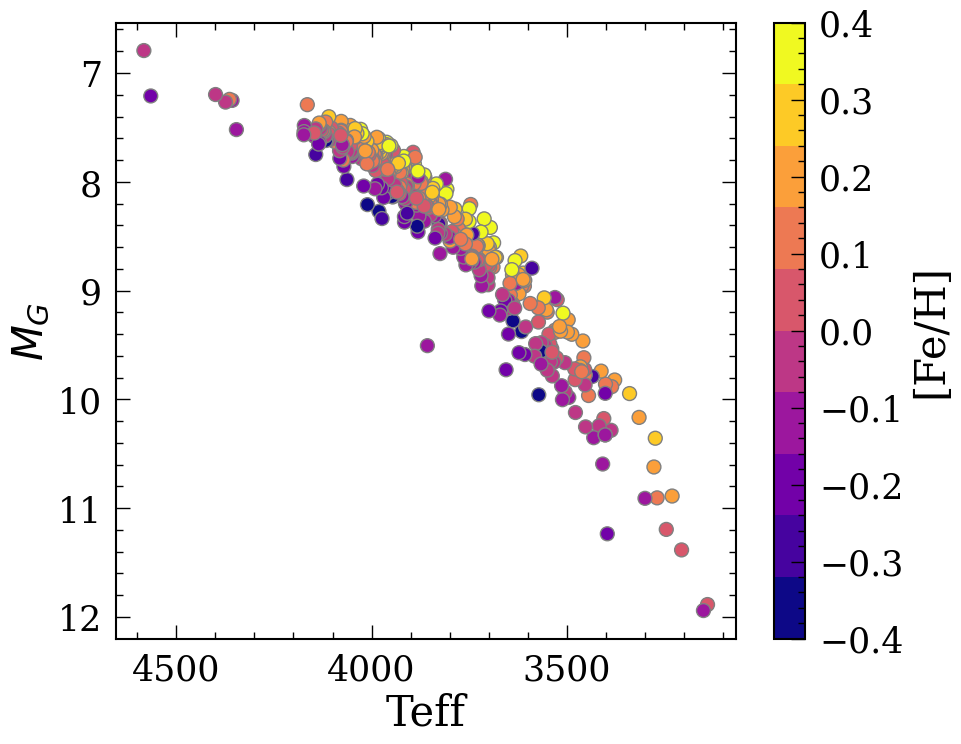

In [214]:
plt.figure(figsize=(10,8))
plt.scatter(feh['teff_calc'],feh['abs_G_dered'],
           c=feh['[Fe/H]'],s=100,edgecolor='grey',vmin=-0.4,
            vmax=0.4,zorder=10,cmap=plt.get_cmap('plasma', 10))
plt.xlabel('Teff')
plt.ylabel('$M_G$')
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()
plt.colorbar(label='[Fe/H]')

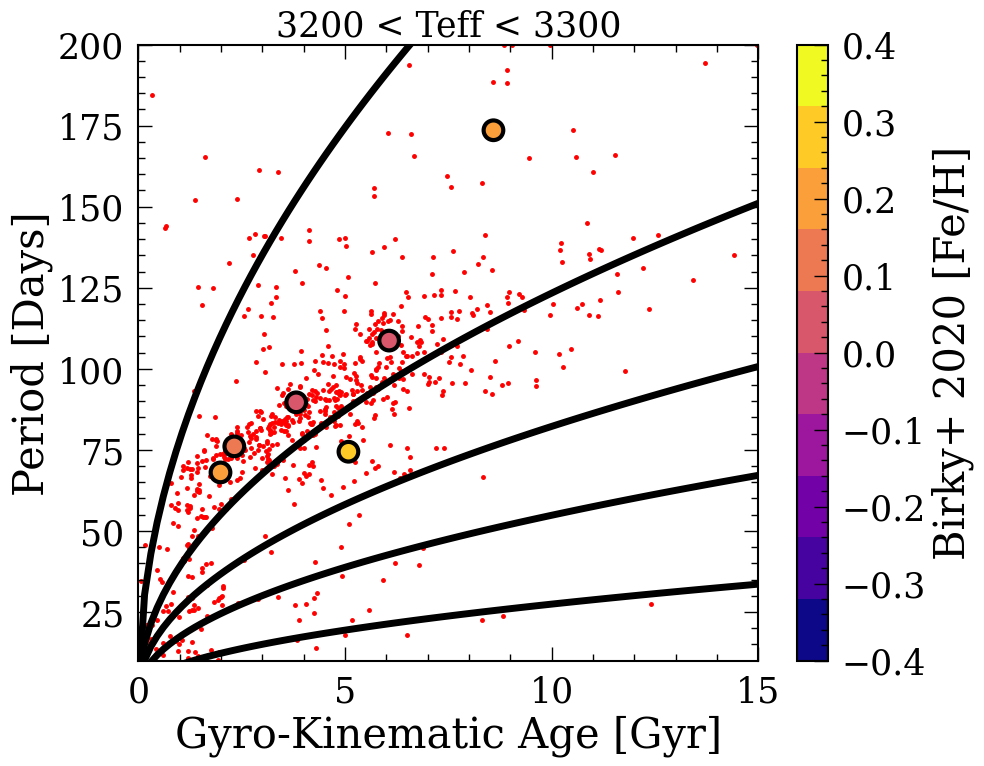

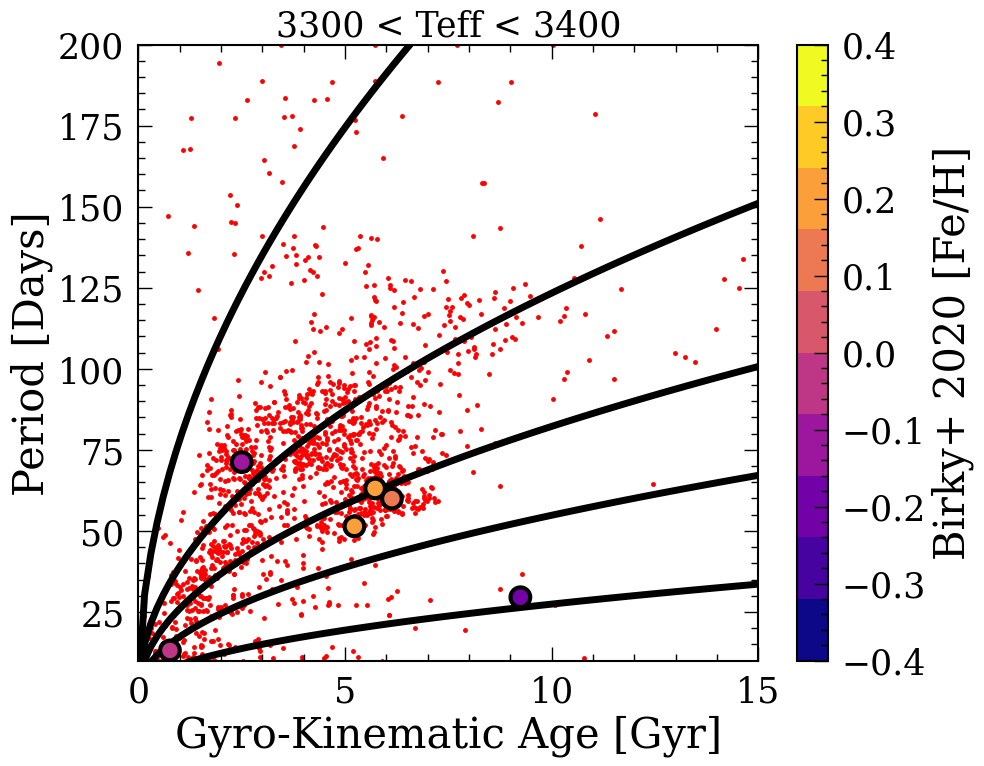

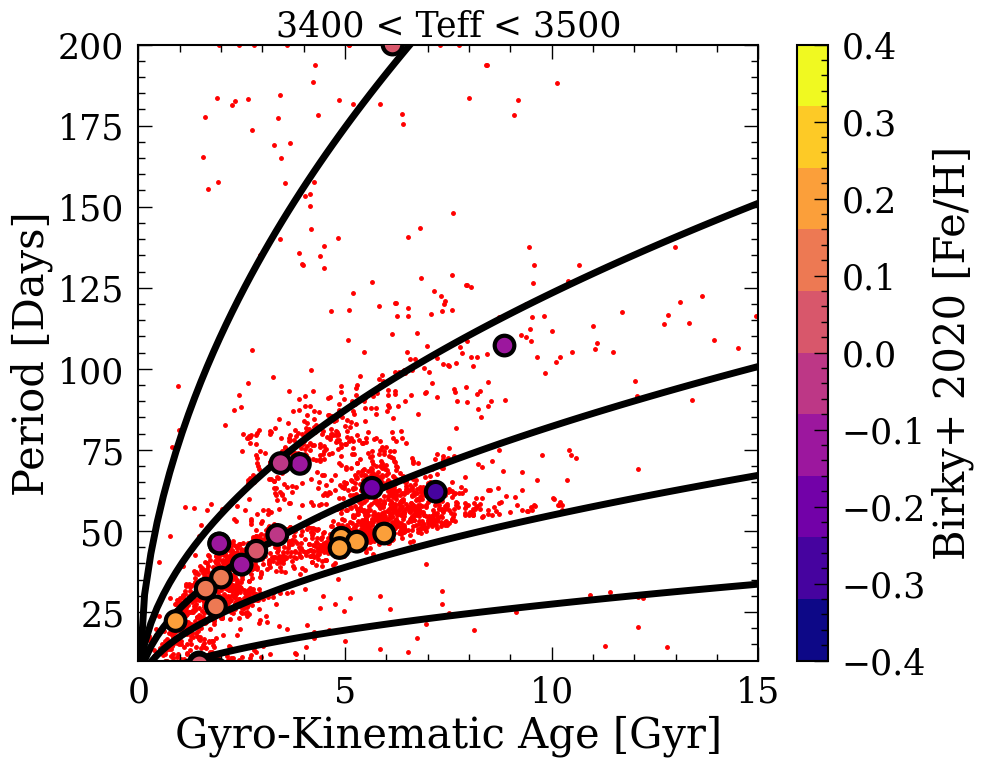

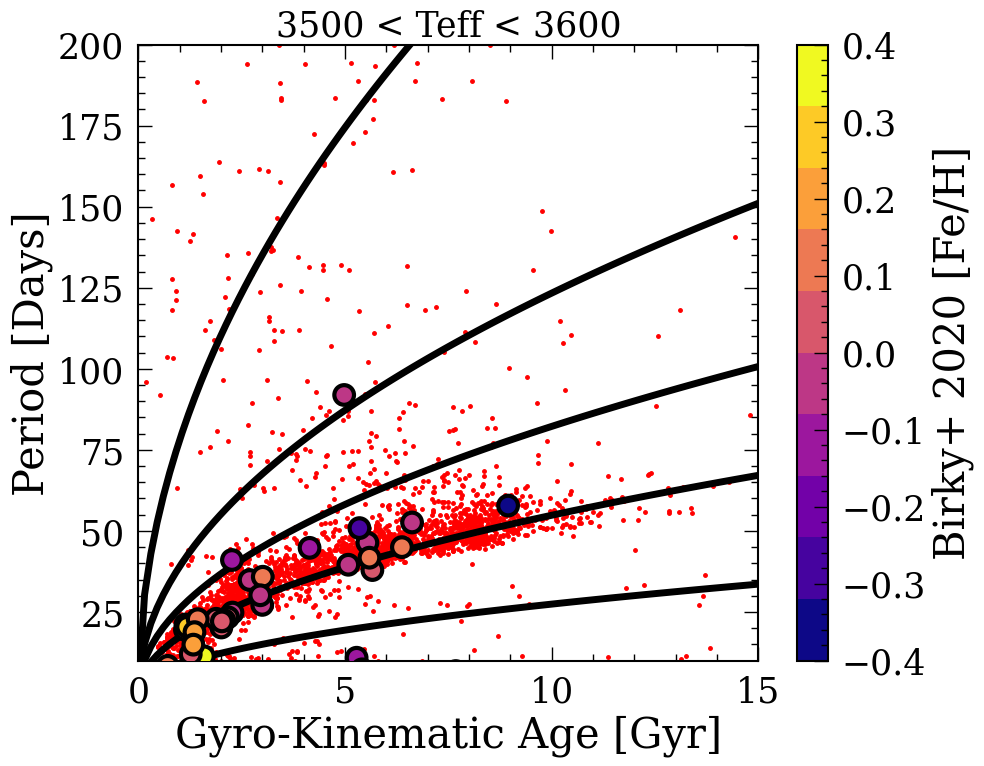

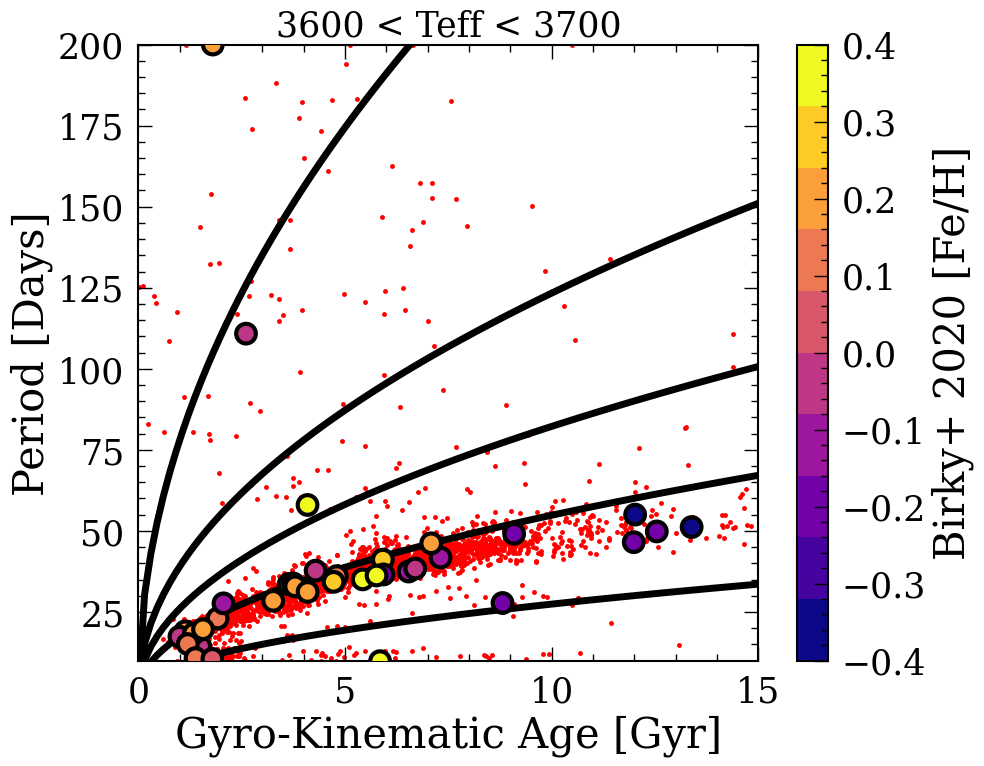

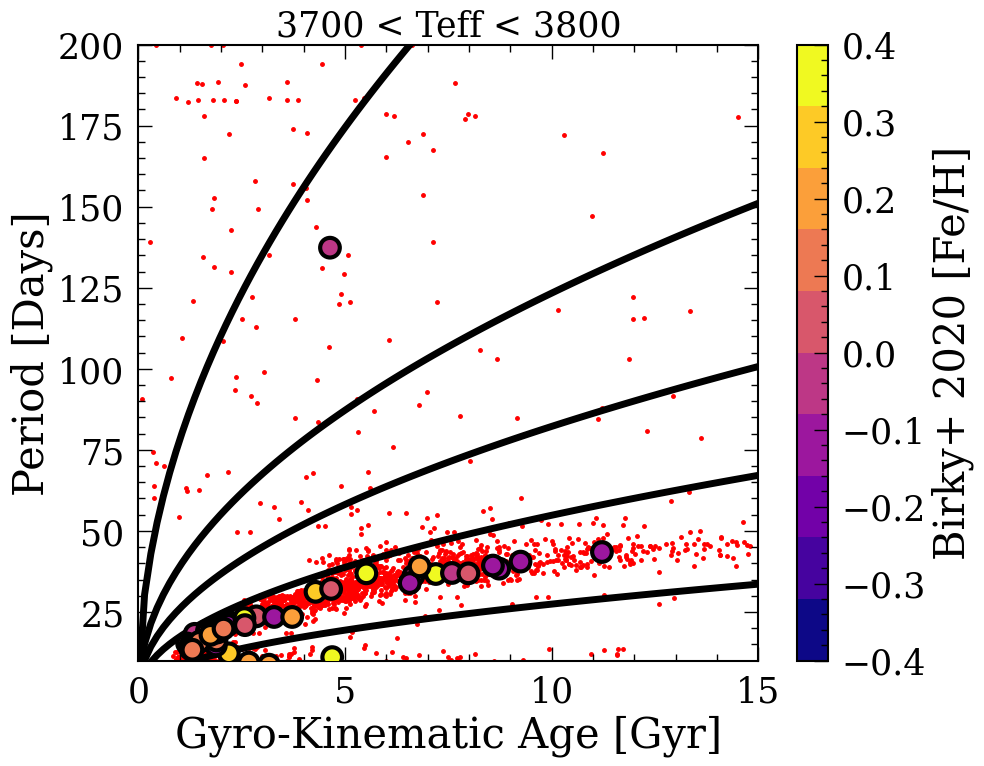

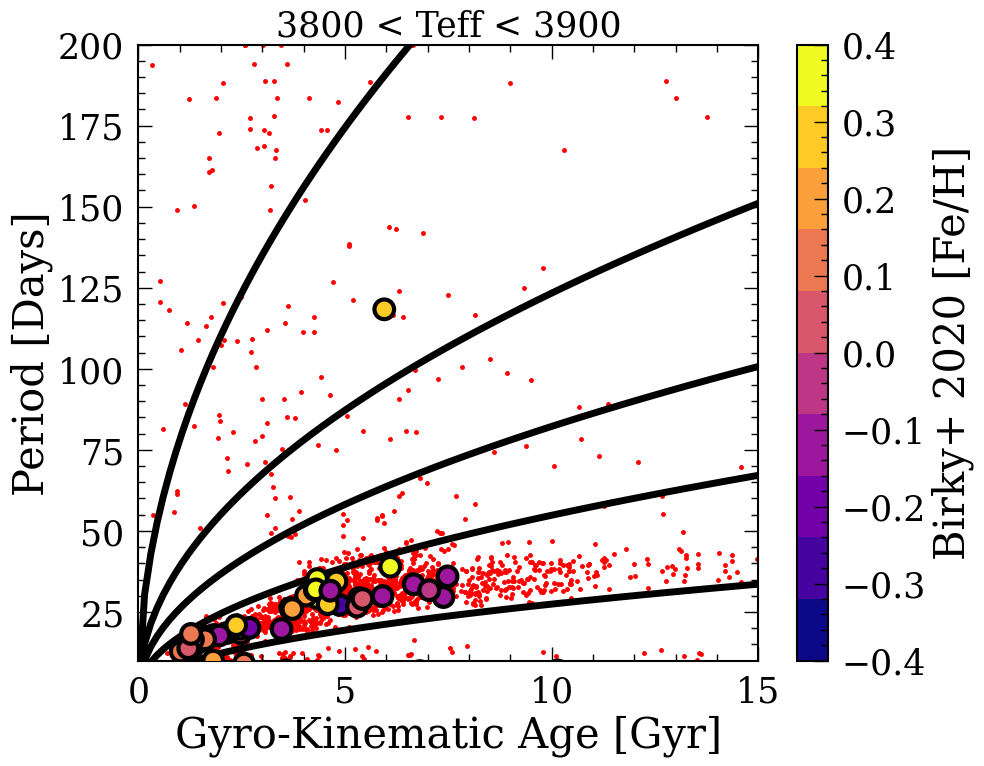

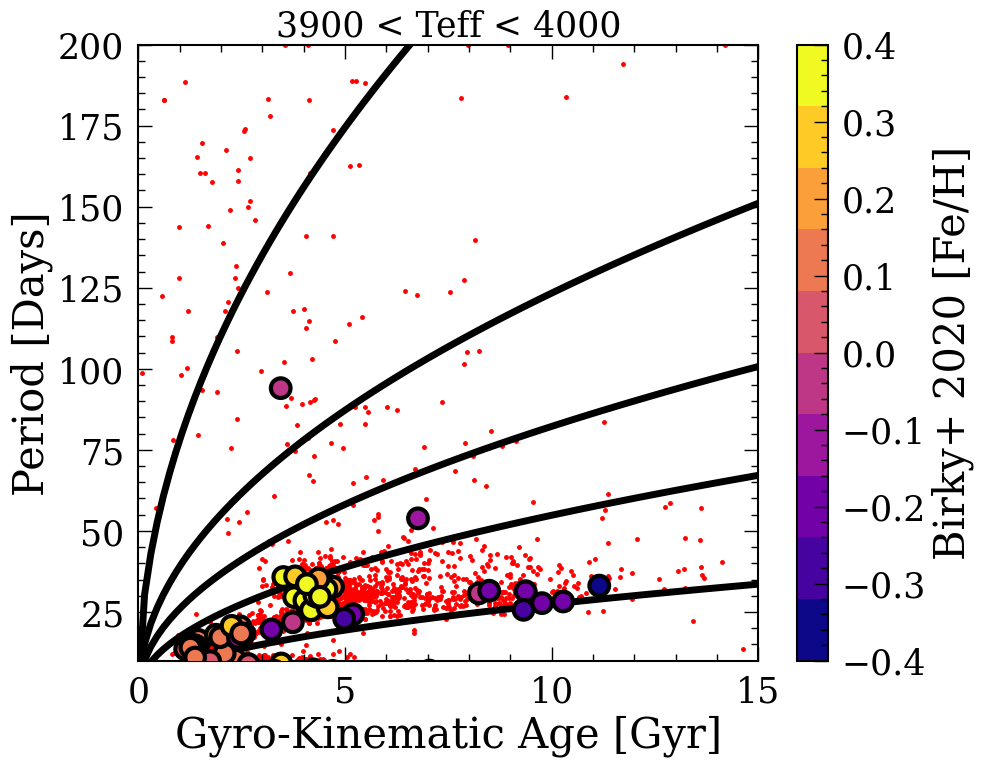

In [220]:
teffrange = np.linspace(3200, 4000, 9)
for i in range(len(teffrange)-1):
    fullyconvective = df.loc[(df['teff_calc']>teffrange[i])&(df['teff_calc']<teffrange[i+1])]
    plt.figure(figsize=(10,8))
    plt.plot(fullyconvective['kin_age'],fullyconvective['Prot'],'r.',markersize=5,zorder=1)
    fullyconvective = fullyconvective.sort_values('kin_age')
    meanave = np.mean(fullyconvective['Prot'][(fullyconvective['kin_age']<2)&(fullyconvective['kin_age']>1)])
    #print(meanave)
    plt.plot(np.linspace(0,15,100), np.linspace(0,15,100)**0.5*26,
            'k-',linewidth=5)
    plt.plot(np.linspace(0,15,100), np.linspace(0,15,100)**0.5*26*1.5,
            'k-',linewidth=5)
    plt.plot(np.linspace(0,15,100), np.linspace(0,15,100)**0.5*26/1.5,
            'k-',linewidth=5)
    plt.plot(np.linspace(0,15,100), np.linspace(0,15,100)**0.5*26*3,
            'k-',linewidth=5)
    plt.plot(np.linspace(0,15,100), np.linspace(0,15,100)**0.5*26/3,
            'k-',linewidth=5)
    plt.title('%d < Teff < %d'%(teffrange[i], teffrange[i+1]), fontsize=25)
    plt.xlim([0,15])
    plt.ylim([10,200])
    #plt.yscale('log')
    plt.xlabel('Gyro-Kinematic Age [Gyr]')
    plt.ylabel('Period [Days]')
    
    
    fullyconvective = feh.loc[(feh['teff_calc']>teffrange[i])&(feh['teff_calc']<teffrange[i+1])]
    if len(fullyconvective) > 0:
        plt.scatter(fullyconvective['kin_age'],fullyconvective['Prot'],c=fullyconvective['[Fe/H]'],
                   s=200,edgecolor='black',vmin=-0.4, vmax=0.4,zorder=10,
                   cmap=plt.get_cmap('plasma', 10),linewidth=3)
    
        plt.colorbar(label='Birky+ 2020 [Fe/H]')

